In [1]:
#Libraries
import pandas as pd
import numpy as np
import scanpy as sc
import os
import warnings
import anndata as ad
from matplotlib import rcParams

In [2]:
#Ignore warnings
warnings.filterwarnings('ignore')

In [3]:
#Scanpy settings
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.2 scipy==1.12.0 pandas==2.2.3 scikit-learn==1.4.2 statsmodels==0.14.0 igraph==0.11.5 pynndescent==0.5.11


In [4]:
#Paths
cellranger_output = "/relative_path/data/derived_data/CellRanger_quantification"
adata_output = "/relative_path/data/anndata"

In [5]:
#Samples
samples = ["BOE7075A1" , "BOE7075A2" , "BOE7075A4"]

In [6]:
#Read in the 10x count files
adatas = {}

for sample in samples:
    
    #Read in 10x file
    adata = sc.read_10x_mtx(
        os.path.join(cellranger_output , sample , "outs" , "filtered_feature_bc_matrix"),
        var_names="gene_symbols")
    
    #Make variables unique
    adata.var_names_make_unique()
    
    #Remove eGFP from the analysis
    adata = adata[:, adata.var_names != "eGFP"]
    
    #Write anndata out to a dictionary
    adatas[sample] = adata

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


## Preprocessing

BOE7075A1
normalizing counts per cell
    finished (0:00:00)


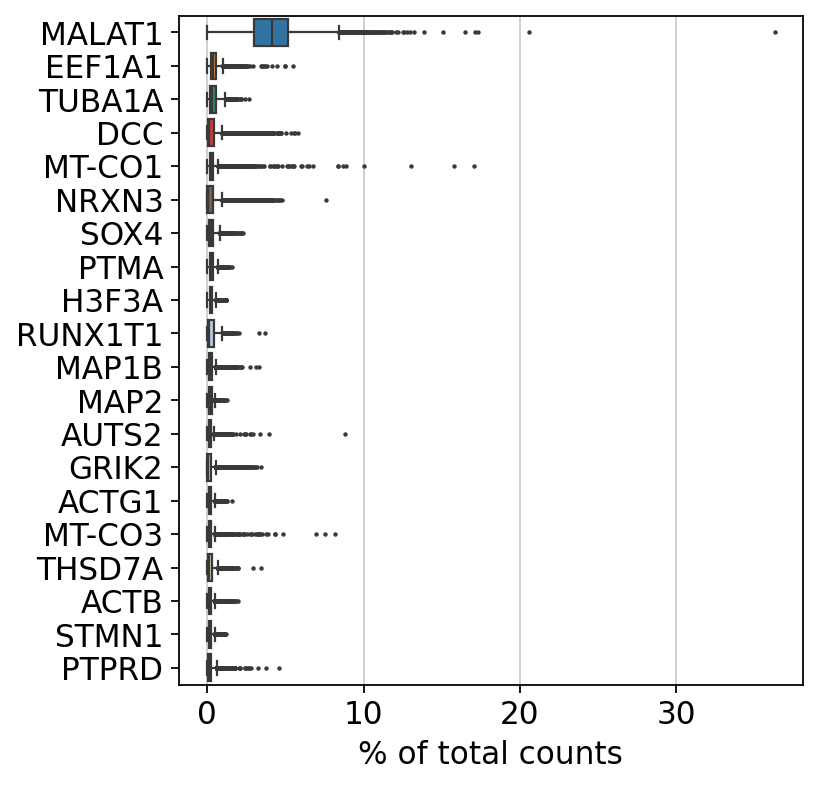

BOE7075A2
normalizing counts per cell
    finished (0:00:00)


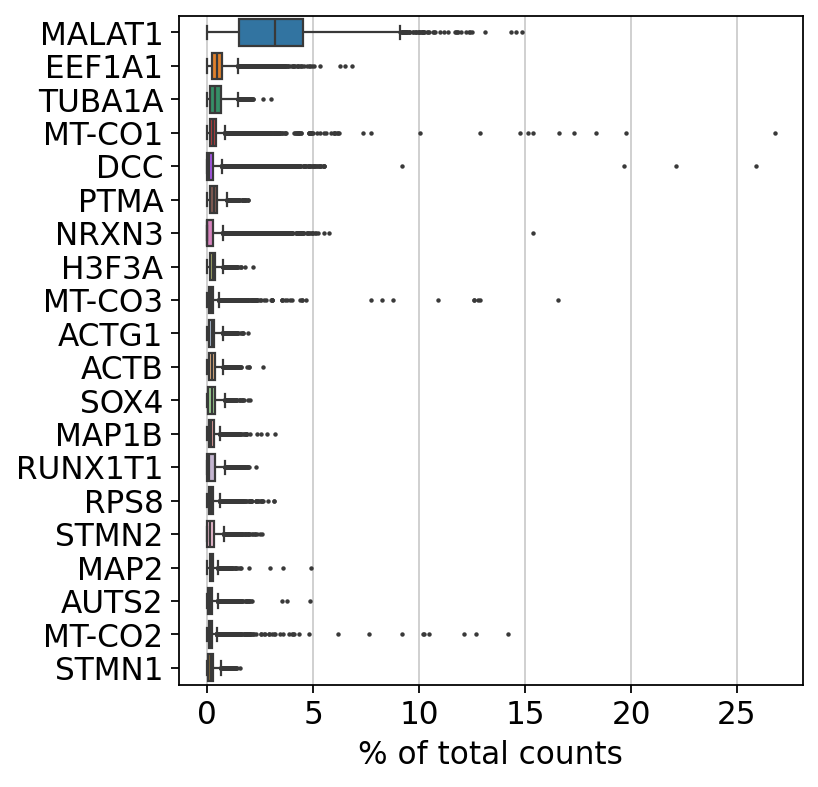

BOE7075A4
normalizing counts per cell
    finished (0:00:00)


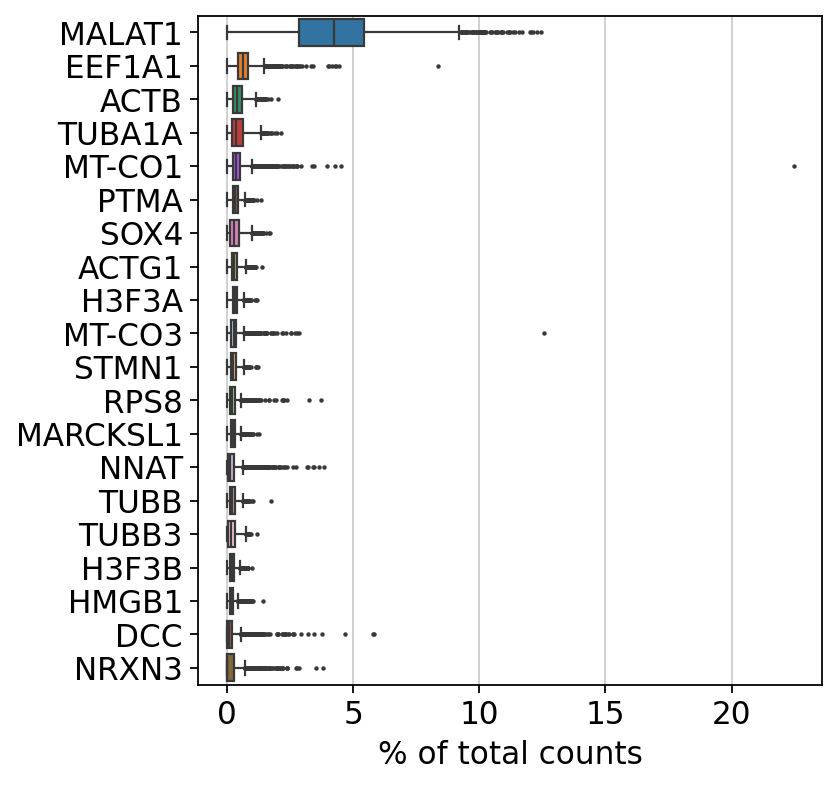

In [7]:
#Get genes with highest count fraction
for sample, adata in adatas.items():
    print(sample)
    sc.pl.highest_expr_genes(adata, n_top=20)

In [8]:
#Basic filtering
for sample, adata in adatas.items():
    print(sample)
    sc.pp.filter_cells(adata, min_genes=200)
    #Here we do 0 because we will do this filter later collectively.
    sc.pp.filter_genes(adata, min_cells=0)

BOE7075A1
filtered out 3 cells that have less than 200 genes expressed
BOE7075A2
filtered out 10 cells that have less than 200 genes expressed
BOE7075A4
filtered out 1 cells that have less than 200 genes expressed


In [9]:
# annotate the group of mitochondrial genes as "mt"
for sample, adata in adatas.items():
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    # ribosomal genes
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
    sc.pp.calculate_qc_metrics(
        adata, qc_vars=["mt","ribo"], percent_top=None, log1p=False, inplace=True
    )

BOE7075A1


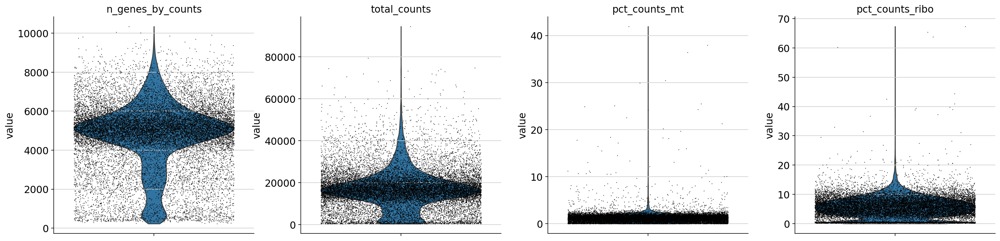

BOE7075A2


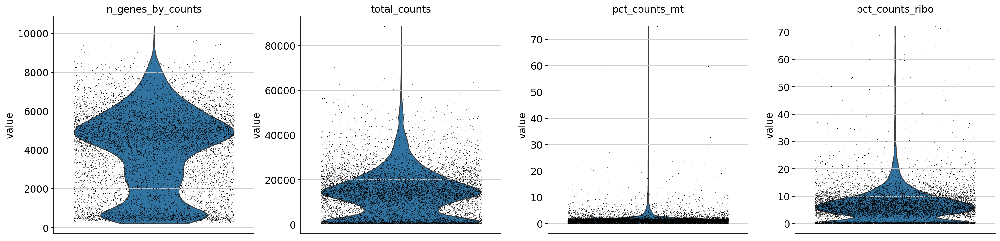

BOE7075A4


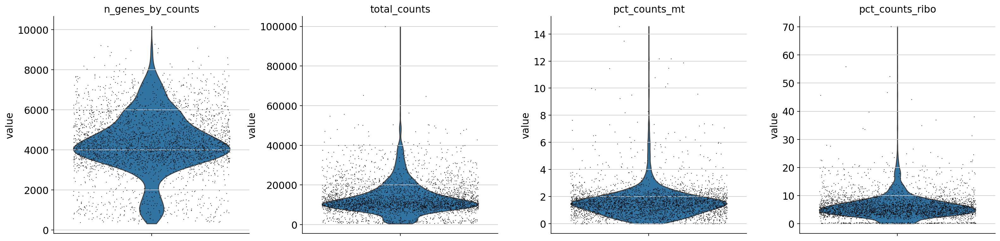

In [10]:
#Plot QC metrics
for sample, adata in adatas.items():
    print(sample)
    sc.pl.violin(
        adata,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_ribo"],
        jitter=0.4,
        multi_panel=True,
    )

In [11]:
#Filtering
min_n_genes_by_counts = {"BOE7075A1" :3000,
                         "BOE7075A2" :3000,
                         "BOE7075A4" : 2000}

max_pct_counts_mt = {"BOE7075A1" : 5,
                         "BOE7075A2" : 5,
                         "BOE7075A4" : 5}
max_total_counts = {"BOE7075A1" : 45000,
                         "BOE7075A2" : 45000,
                         "BOE7075A4" : 45000}

In [12]:
adatas_filtered = {}
for sample, adata in adatas.items():
    adata = adata[adata.obs.n_genes_by_counts > min_n_genes_by_counts[sample], :]
    adata = adata[adata.obs.pct_counts_mt < max_pct_counts_mt[sample], :].copy()
    adata = adata[adata.obs.total_counts < max_total_counts[sample], :].copy()
    adatas_filtered[sample] = adata

BOE7075A1


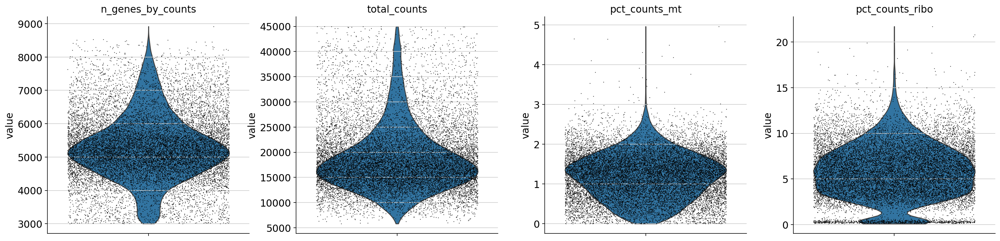

BOE7075A2


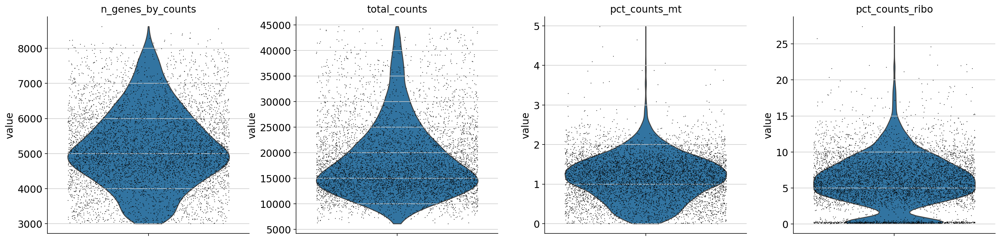

BOE7075A4


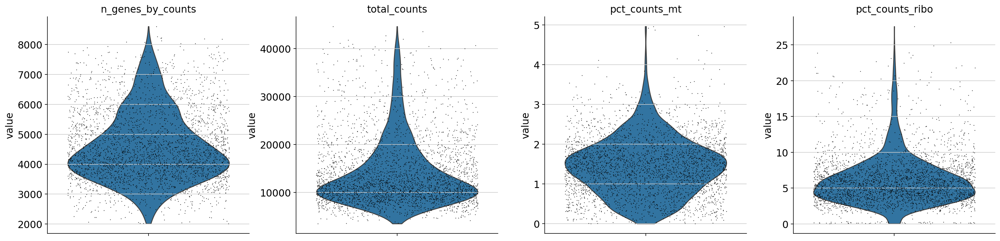

In [13]:
#Plot QC metrics
for sample, adata in adatas_filtered.items():
    print(sample)
    sc.pl.violin(
        adata,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_ribo"],
        jitter=0.4,
        multi_panel=True,
    )

In [14]:
#Doublet detection
for sample, adata in adatas_filtered.items():
    print(sample)
    sc.pp.scrublet(adata)

BOE7075A1
Running Scrublet
filtered out 7141 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.19
Detected doublet rate = 4.1%
Estimated detectable doublet fraction = 62.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 6.5%
    Scrublet finished (0:01:31)
BOE7075A2
Running Scrublet
filtered out 9574 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_v

In [15]:
#Put the count data in a layer
for sample, adata in adatas_filtered.items():
    adata.layers['counts']=adata.X.copy()

BOE7075A1
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


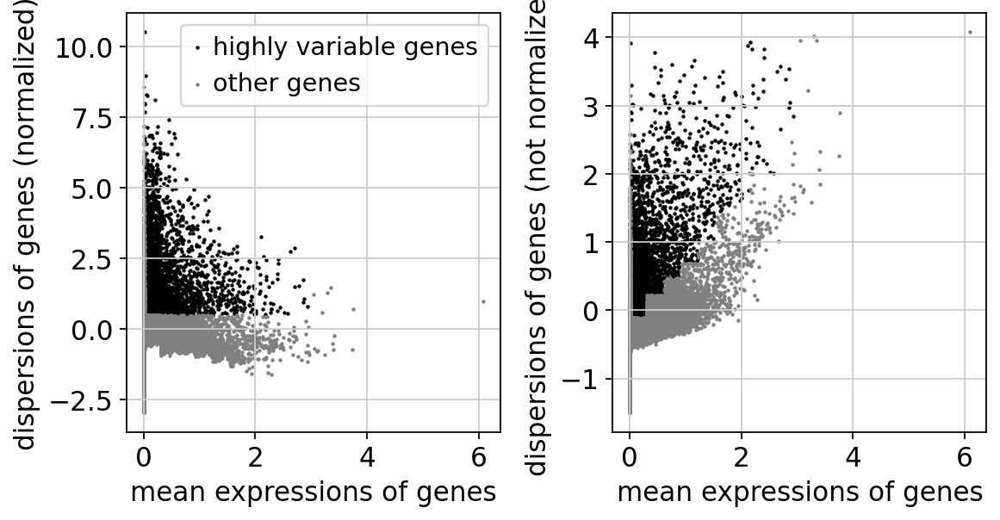

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
BOE7075A2
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


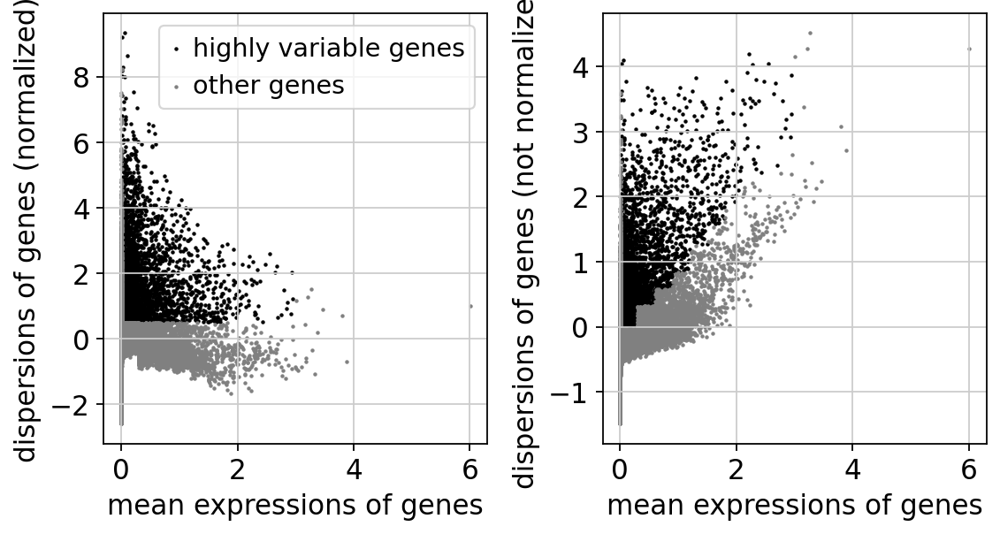

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
BOE7075A4
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


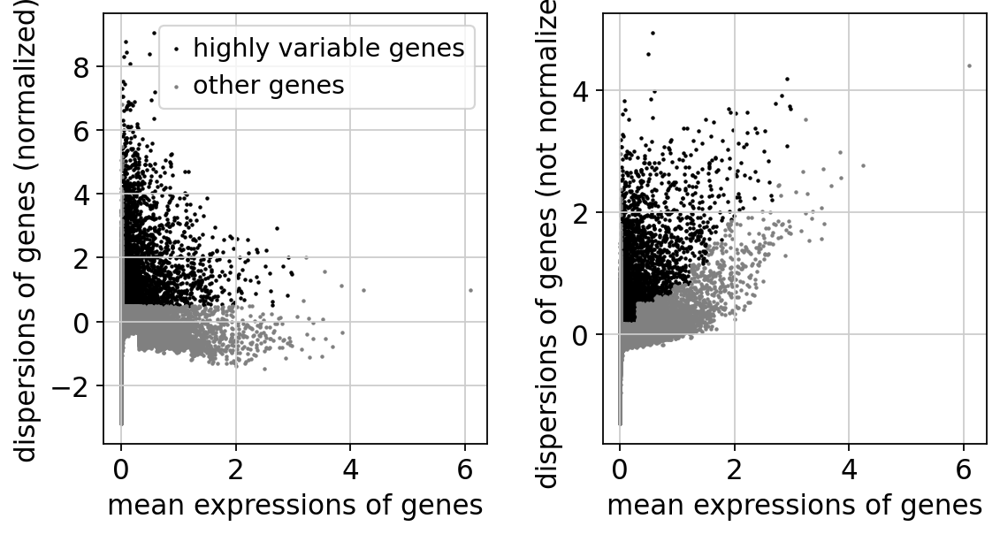

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [16]:
#Normalise, logtransform and find variable genes
for sample, adata in adatas_filtered.items():
    print(sample)
    
    #Normalise
    sc.pp.normalize_total(adata, target_sum=1e4)
    
    #Log transform
    sc.pp.log1p(adata)
    
    #Make lognorm layer
    adata.layers['lognorm']=adata.X.copy()
    
    #Find highly variable genes
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    
    #Plot highly variable genes
    sc.pl.highly_variable_genes(adata)
    
    #Scale the data
    sc.pp.scale(adata, max_value=10)

In [17]:
#Dimensionality reduction 
for sample, adata in adatas_filtered.items():
    print(sample)
    
    #PCA
    sc.tl.pca(adata)
    
    #Graph
    sc.pp.neighbors(adata)
    
    #Leiden Clustering
    sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
    
    #UMAP
    sc.tl.umap(adata)

BOE7075A1
computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 36 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
BOE7075A2
computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 32 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UM

BOE7075A1


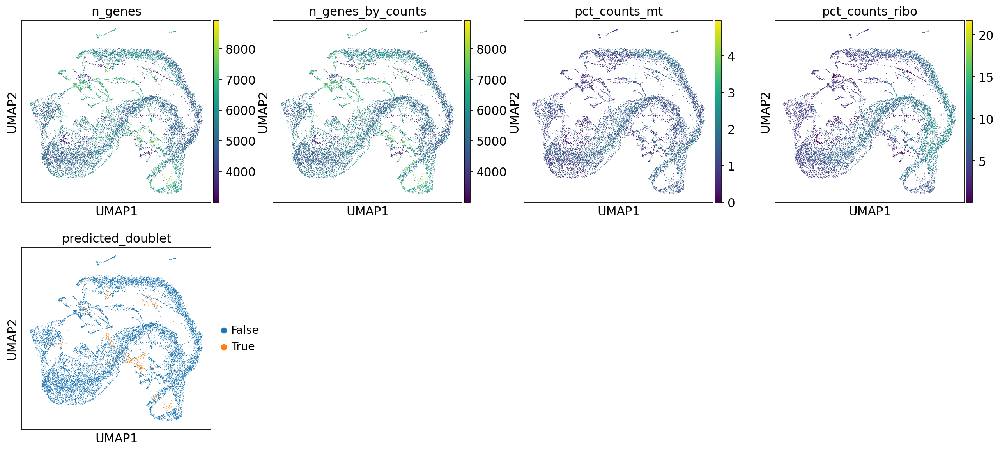

BOE7075A2


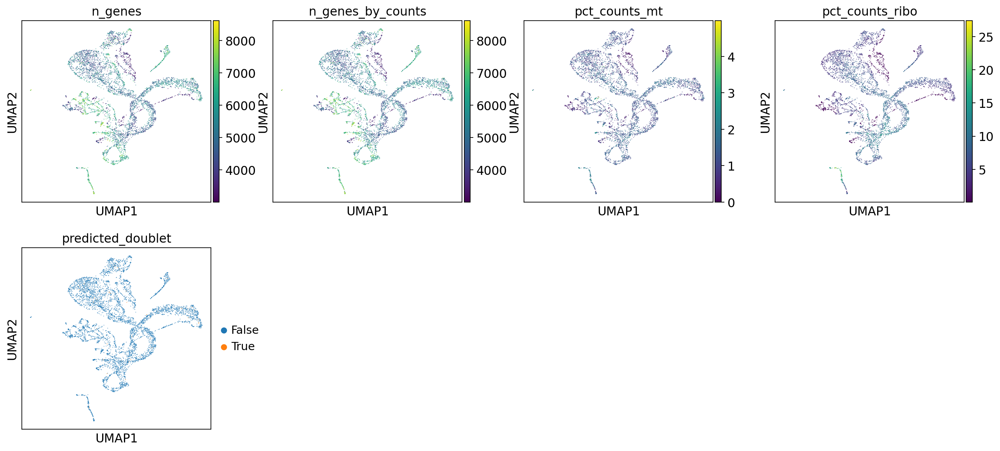

BOE7075A4


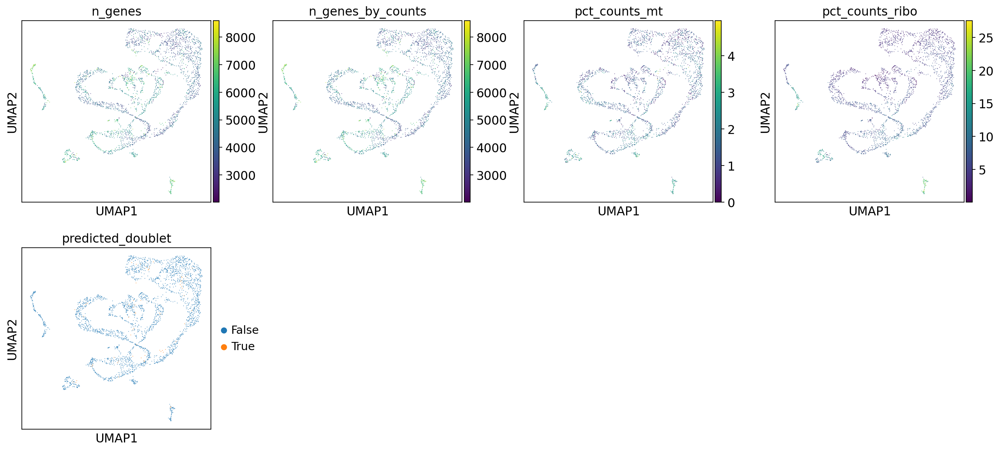

In [19]:
#Plot features on UMAP
for sample, adata in adatas_filtered.items():
    print(sample)
    sc.pl.umap(
        adata,
        color=["n_genes","n_genes_by_counts","pct_counts_mt","pct_counts_ribo","predicted_doublet"],
        # Setting a smaller point size to get prevent overlap
        size=2,
    )

## Re-asses quality control and filtering

BOE7075A1


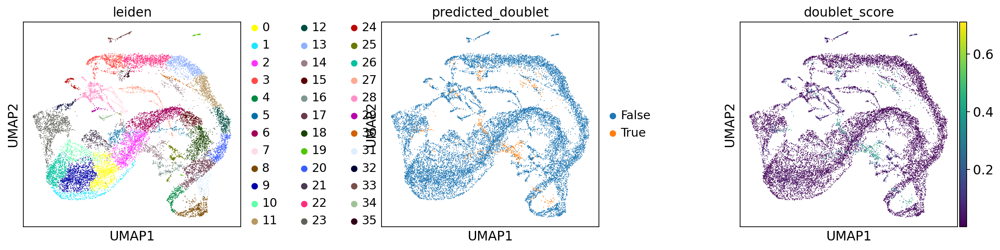

BOE7075A2


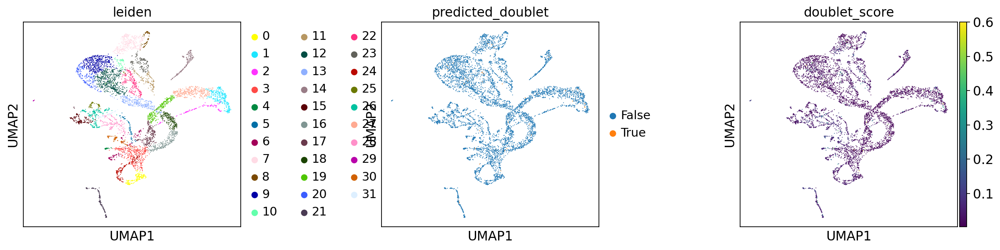

BOE7075A4


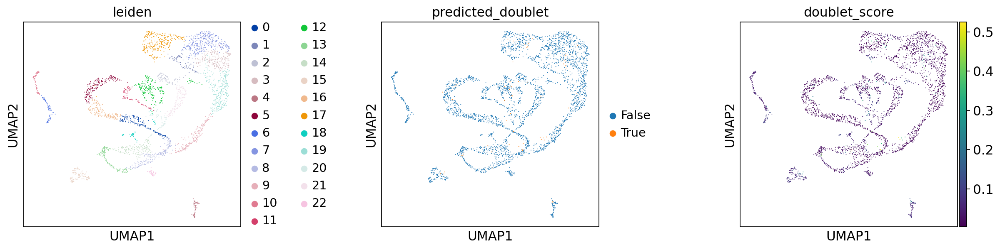

In [20]:
#Doublets
for sample, adata in adatas_filtered.items():
    print(sample)
    sc.pl.umap(
        adata,
        color=["leiden", "predicted_doublet", "doublet_score"],
        # increase horizontal space between panels
        wspace=0.5,
        size=3,
    )

BOE7075A1


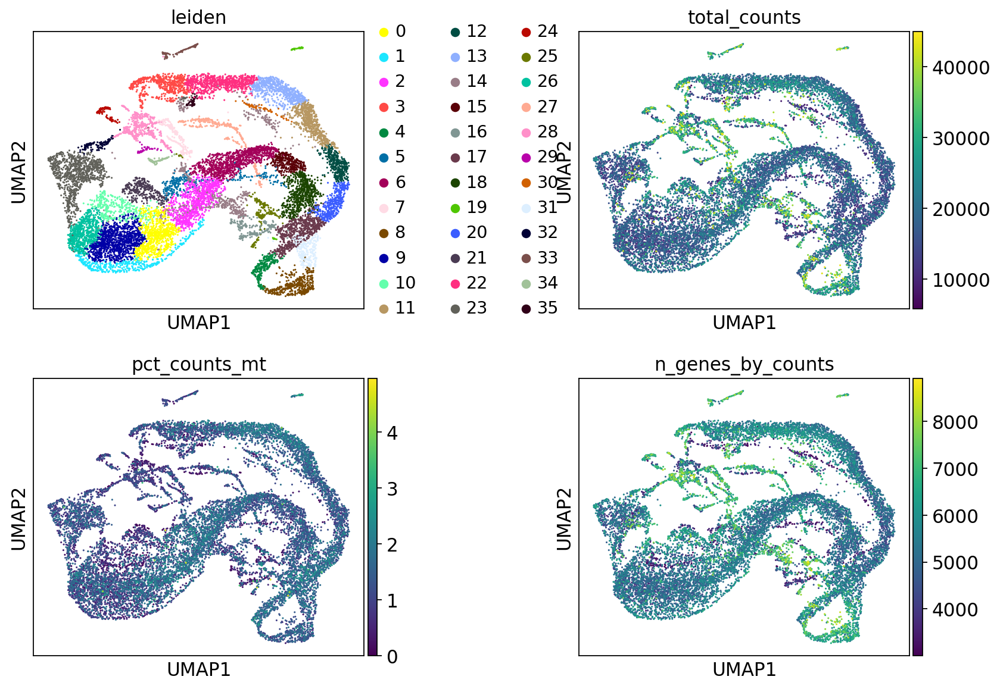

BOE7075A2


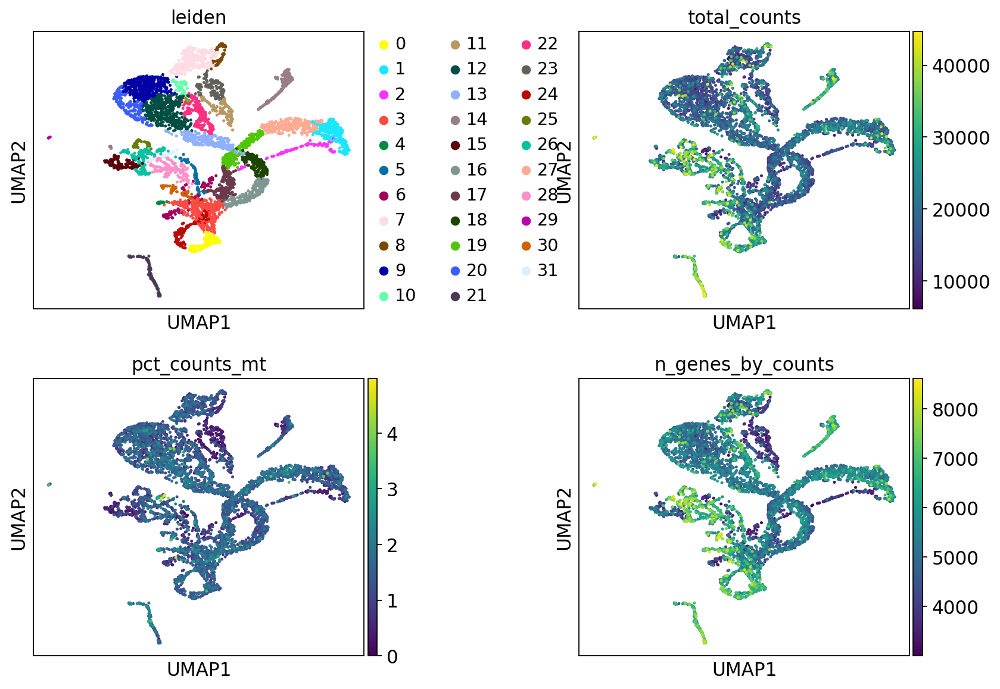

BOE7075A4


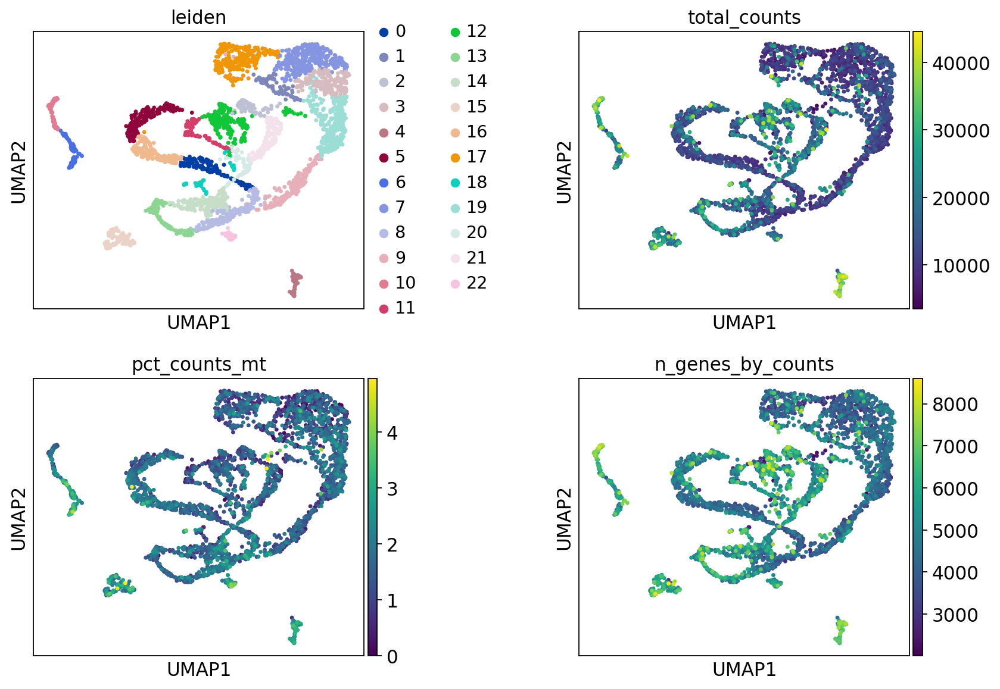

In [21]:
#QC
for sample, adata in adatas_filtered.items():
    print(sample)
    sc.pl.umap(
        adata,
        color=["leiden", "total_counts", "pct_counts_mt", "n_genes_by_counts"],
        wspace=0.5,
        ncols=2,
    )

In [22]:
#Remove doublet cells
adatas_final = {}
for sample, adata in adatas_filtered.items():
    adata = adata[adata.obs.predicted_doublet == False, :]
    adatas_final[sample] = adata

BOE7075A1


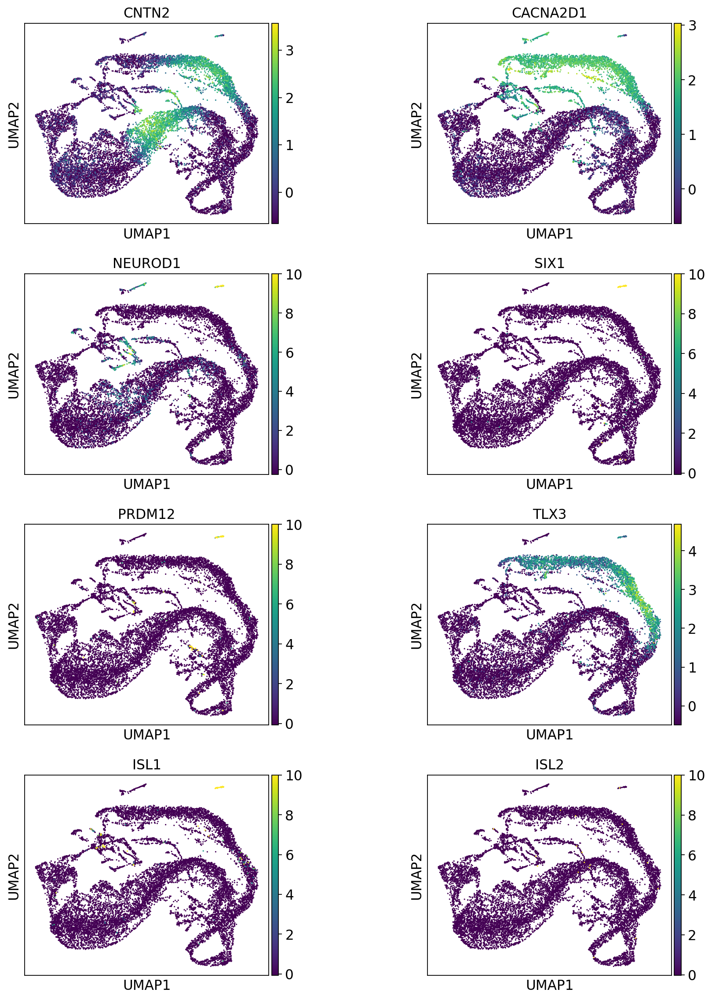

BOE7075A2


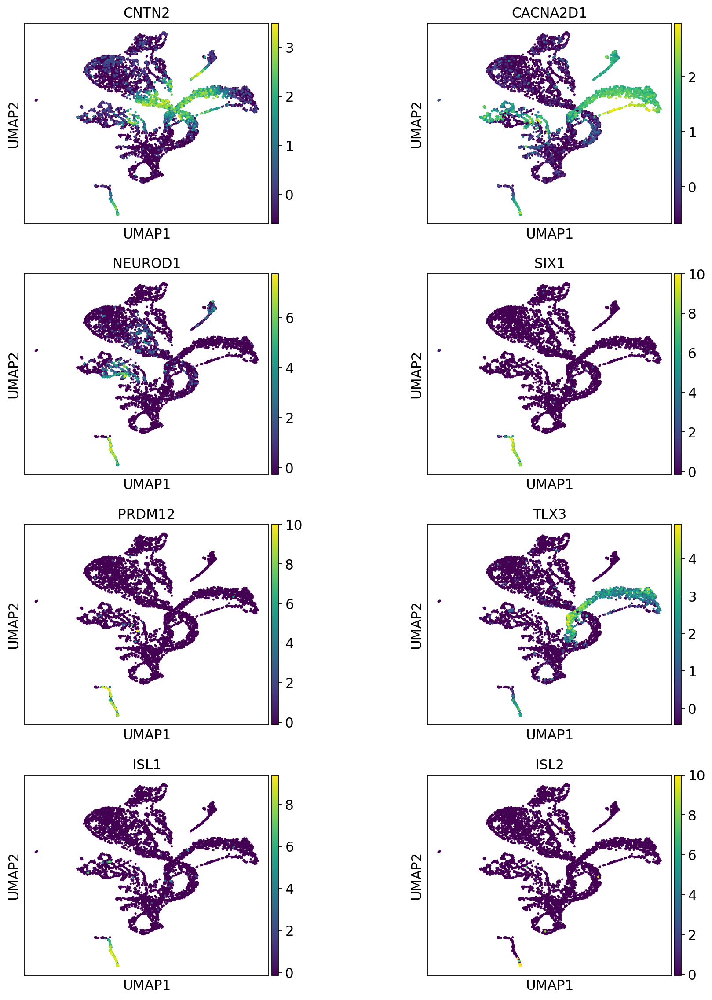

BOE7075A4


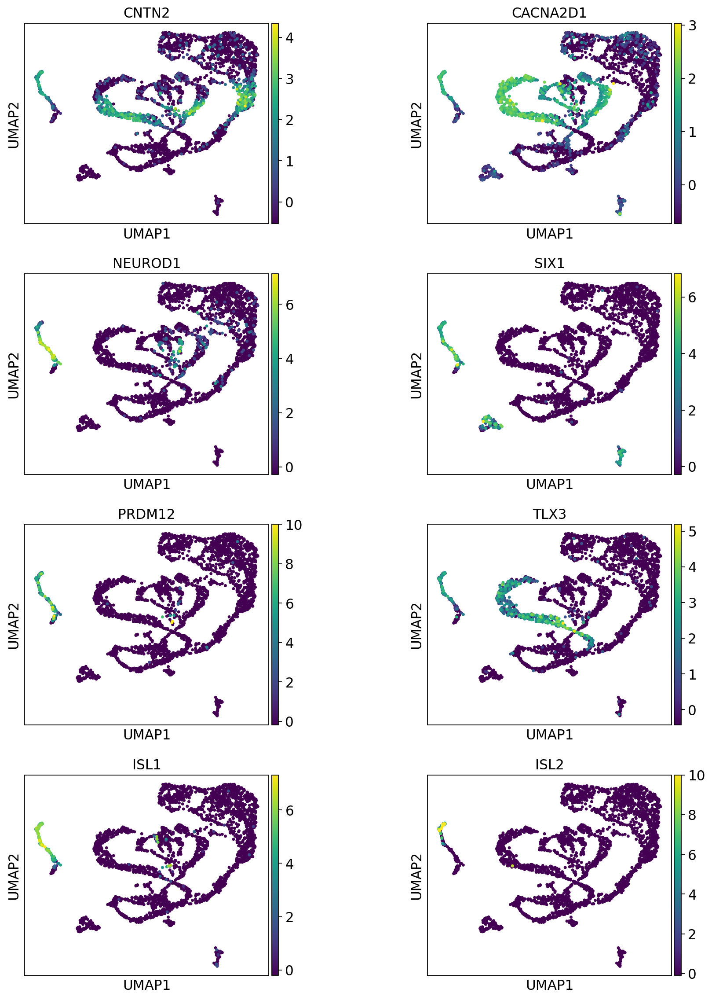

In [23]:
#We are not interested in DRG neurons: identify clusters to remove them
for sample, adata in adatas_final.items():
    print(sample)
    sc.pl.umap(
        adata,
        color=["CNTN2" , "CACNA2D1","NEUROD1","SIX1","PRDM12","TLX3","ISL1","ISL2"],
        wspace=0.5,
        ncols=2,
    )

BOE7075A1


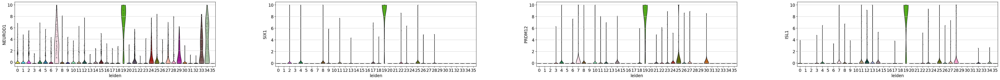

BOE7075A2


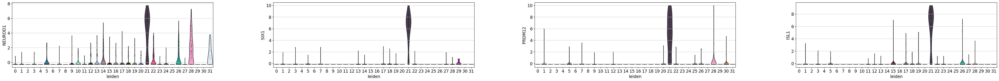

BOE7075A4


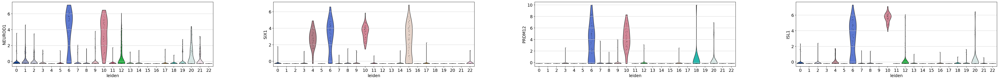

In [24]:
#We are not interested in DRG neurons: identify clusters to remove them
for sample, adata in adatas_final.items():
    print(sample)
    rcParams["figure.figsize"] = (10, 4)
    sc.pl.violin(adata, ["NEUROD1","SIX1","PRDM12","ISL1"], groupby="leiden")

In [25]:
#DRG clusters to remove
remove_clusters = {"BOE7075A1" : ['19'],
                  "BOE7075A2" : ['21'],
                  "BOE7075A4" : ['6','10']}

In [26]:
#Remove DRG clusters
adatas_noDRG = {}
for sample, adata in adatas_final.items():
    adata = adata[~adata.obs["leiden"].isin(remove_clusters[sample])].copy()
    adatas_noDRG[sample] = adata

In [27]:
#Merge adata
merged_adata = ad.concat(adatas_noDRG , label = "sample")

In [28]:
merged_adata.obs.index = [indx[:-1] + sample[-1] for indx , sample in zip(merged_adata.obs.index , merged_adata.obs["sample"])]

In [29]:
#Clear obsm data
merged_adata.obsm.clear()

In [30]:
#Remove genes that are not expressed in a minimum amount of cells
sc.pp.filter_genes(merged_adata, min_cells=3)

filtered out 6191 genes that are detected in less than 3 cells


In [31]:
#Write out adata object
merged_adata.write(os.path.join(adata_output , "preprocessing_larry_human.h5ad"))